In [1]:
import os
import sys
import random
import math
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt
import mrcnn.model as modellib
sys.path.append(os.path.join("samples/coco/"))
import coco
from mrcnn import utils
from mrcnn import visualize

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join("logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join("mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join("images_examp")

/usr/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or '1type' as a synonym of 

In [3]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()


In [4]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

# Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True)








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [5]:
# COCO Class names
# Index of the class in the list is its ID. For example, to get ID of
# the teddy bear class, use: class_names.index('teddy bear')
classes = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'doughnut', 'cake', 'chair', 'couch', 'pot plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

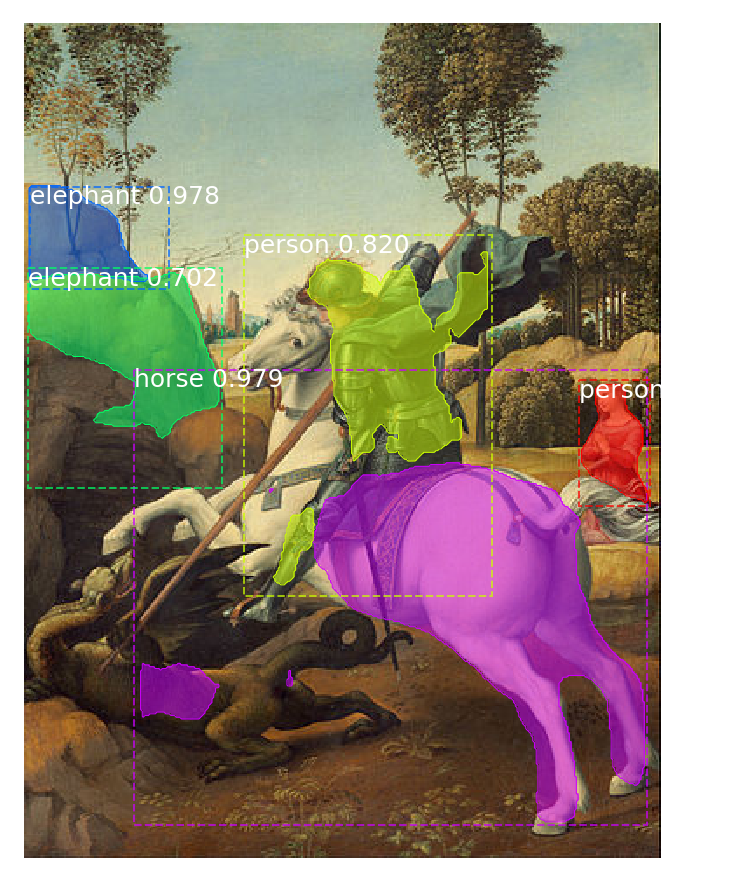

In [7]:
import pandas as pd
file_names = next(os.walk(IMAGE_DIR))[2]
image = skimage.io.imread(os.path.join(IMAGE_DIR, random.choice(file_names)))
century=20
# Run detection
results = model.detect([image],verbose=0)[0]
# Visualize results
visualize.display_instances(image, results['rois'], results['masks'], results['class_ids'], 
                           classes, results['scores'])


probs                    shape: (1, 1000, 81)         min:    0.00000  max:    0.99970  float32
INFO: Time-matrix was loaded correctly
INFO: Time-matrix didn't apply for class  horse . 
INFO: Options for class  elephant
         Name      Prob
0        bird  0.220626
3      person  0.085394
5  teddy bear  0.043176
2         cow  0.035423
4       sheep  0.005243
1       chair  0.000916
INFO: For class  elephant  was chosen class  bird
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Options for class  elephant
         Name      Prob
2      person  0.085394
4  teddy bear  0.043176
1         cow  0.035423
3       sheep  0.005243
0       chair  0.000916
INFO: For class  elephant  was chosen class  person


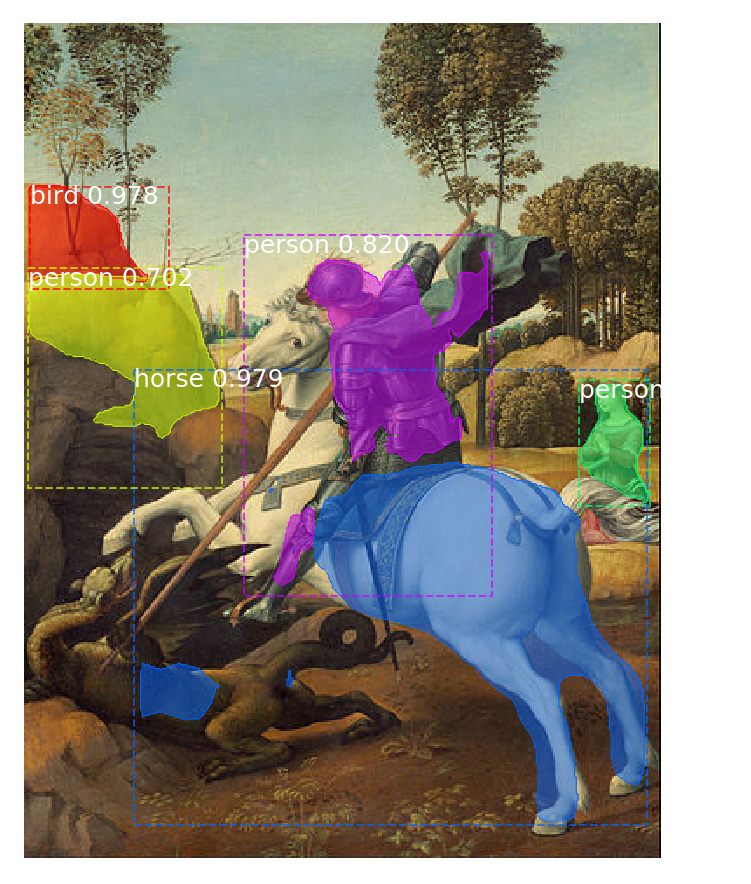

In [8]:
century=13
res_time=model.time_matrix_application(image,century,classes)
visualize.display_instances(image, res_time['rois'], res_time['masks'], res_time['class_ids'], 
                           classes, res_time['scores'])

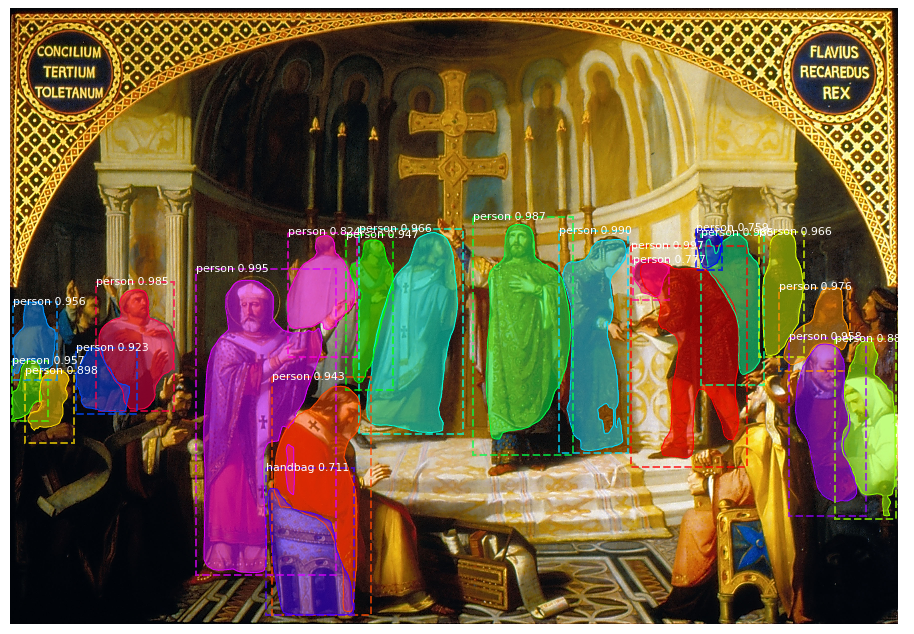

In [22]:
file_names = next(os.walk(IMAGE_DIR))[2]
image = skimage.io.imread(os.path.join(IMAGE_DIR, random.choice(file_names)))
century=20
# Run detection
results = model.detect([image],verbose=0)[0]
# Visualize results
visualize.display_instances(image, results['rois'], results['masks'], results['class_ids'], 
                           classes, results['scores'])


probs                    shape: (1, 1000, 81)         min:    0.00000  max:    0.99948  float32
INFO: Time-matrix was loaded correctly
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply fo

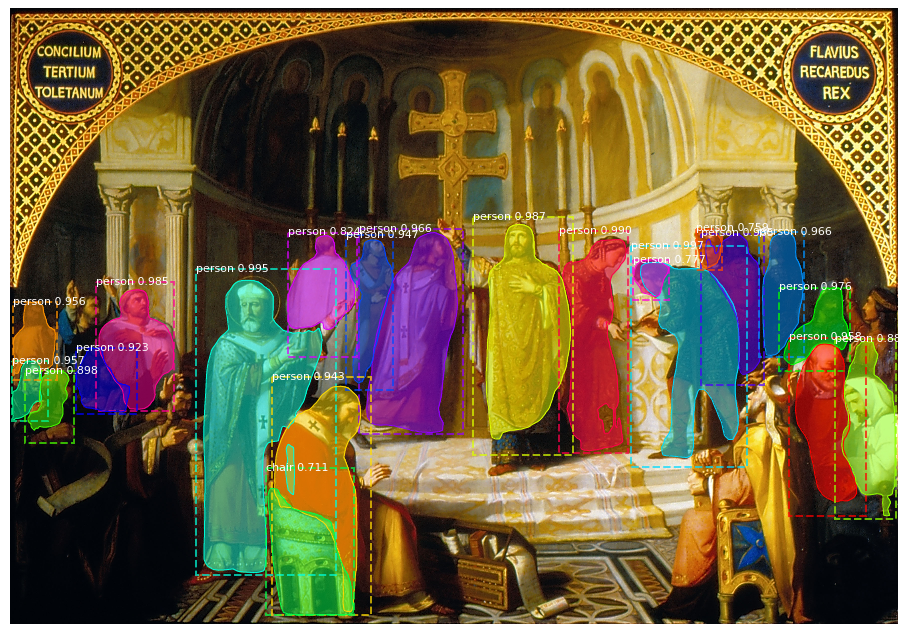

In [24]:
century=14
res_time=model.time_matrix_application(image,century,classes)
visualize.display_instances(image, res_time['rois'], res_time['masks'], res_time['class_ids'], 
                           classes, res_time['scores'])

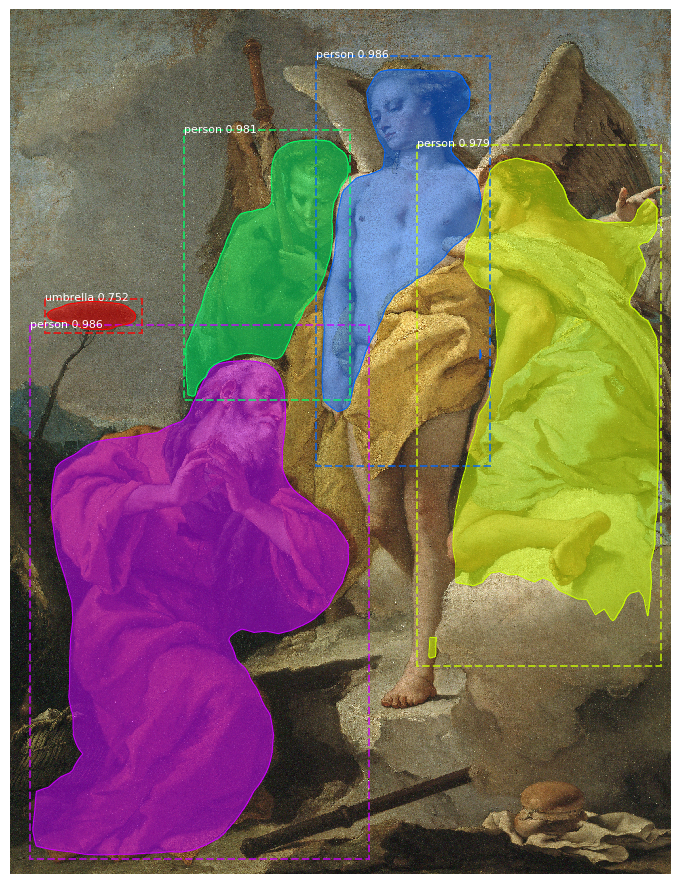

In [58]:
file_names = next(os.walk(IMAGE_DIR))[2]
image = skimage.io.imread(os.path.join(IMAGE_DIR, random.choice(file_names)))
century=20
# Run detection
results = model.detect([image],verbose=0)[0]
# Visualize results
visualize.display_instances(image, results['rois'], results['masks'], results['class_ids'], 
                           classes, results['scores'])


probs                    shape: (1, 1000, 81)         min:    0.00000  max:    0.99969  float32
INFO: Time-matrix was loaded correctly
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  person . 
INFO: Options for class  umbrella
        Name      Prob
1  pot plant  0.000293
0       kite  0.000248
2  stop sign  0.000124


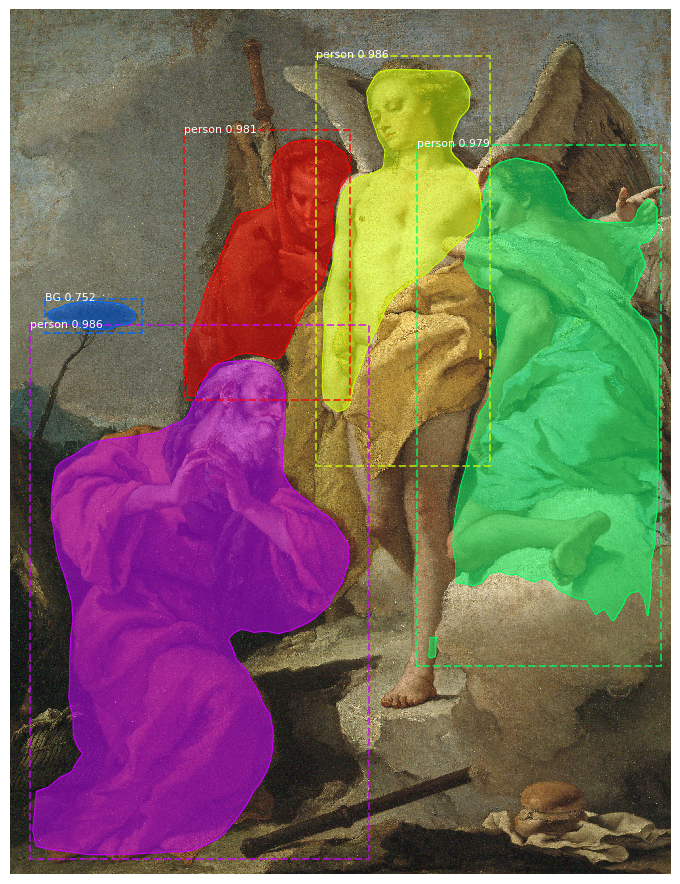

In [60]:
century=13
res_time=model.time_matrix_application(image,century,classes)
visualize.display_instances(image, res_time['rois'], res_time['masks'], res_time['class_ids'], 
                           classes, res_time['scores'])

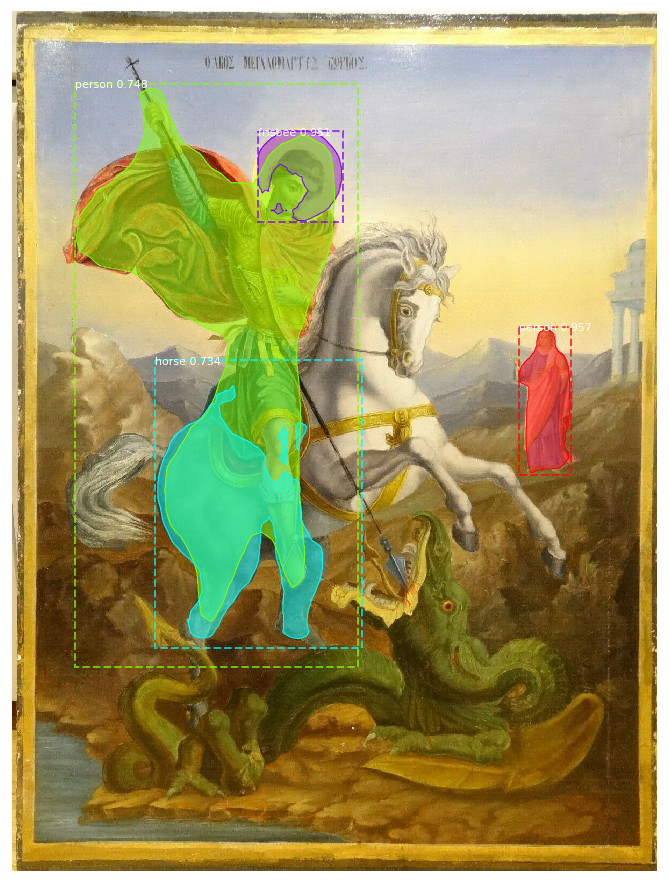

In [62]:
file_names = next(os.walk(IMAGE_DIR))[2]
image = skimage.io.imread(os.path.join(IMAGE_DIR, random.choice(file_names)))
century=20
# Run detection
results = model.detect([image],verbose=0)[0]
# Visualize results
visualize.display_instances(image, results['rois'], results['masks'], results['class_ids'], 
                           classes, results['scores'])


probs                    shape: (1, 1000, 81)         min:    0.00000  max:    0.99998  float32
INFO: Time-matrix was loaded correctly
INFO: Time-matrix didn't apply for class  person . 
INFO: Options for class  frisbee
            Name      Prob
1      surfboard  0.009255
2  tennis racket  0.007708
0    sports ball  0.003659
INFO: Time-matrix didn't apply for class  person . 
INFO: Time-matrix didn't apply for class  horse . 


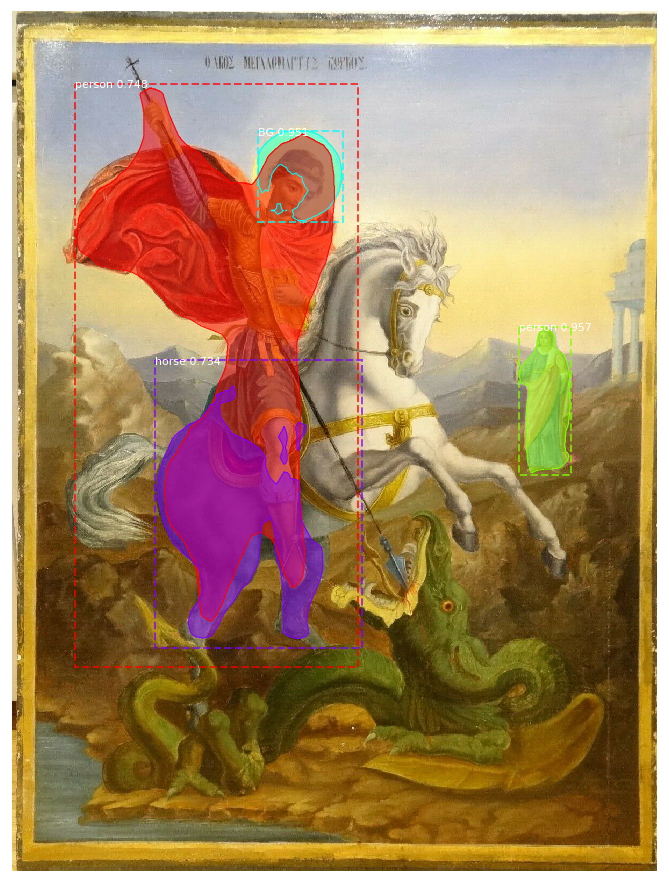

In [63]:
century=13
res_time=model.time_matrix_application(image,century,classes)
visualize.display_instances(image, res_time['rois'], res_time['masks'], res_time['class_ids'], 
                           classes, res_time['scores'])